In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import librosa.display

import utils
import MMDenseLSTM


# Parameters

In [2]:
'''
Train Parameters
'''
restore_path = 'save/MMDenseLSTM/save-299000'
save_path = 'save/MMDenseLSTM/save'
log_path = 'save/MMDenseLSTM'

'''
Dataset Parameters
'''

train_data_dir = '/home/scpark/hard/datasets/musdb18_wav'
test_data_dir = '/home/scpark/hard/datasets/musdb18_wav/test'

'''
Network Parameters
'''

# batch of the input data
Batch = None
# sample length of the input data
Length = None
# FFT size in STFT
FFT_size = 4096
# hop size in STFT
Hop_size = 1024
# total bins 
Bins = int(FFT_size / 2 + 1)
# channels (left, right)
Channels = 2
# band1 start bin, band2 start bin, band3 start bin, band3 end bin 
bands = [0, 384, 1024, 2048]


# Prepare Data Files

In [3]:
train_data_files = utils.get_data_files(train_data_dir)
print('train data files num :', len(train_data_files))

test_data_files = utils.get_data_files(test_data_dir)
print('test data files num :', len(test_data_files))

train data files num : 2334
test data files num : 1254


# Draw Graph

In [4]:

tf.reset_default_graph()

audios = tf.placeholder(dtype=tf.float32, shape=[Batch, Length, Channels])
vocals = tf.placeholder(dtype=tf.float32, shape=[Batch, Length, Channels])

audios_mag, audios_phase = utils.stft(audios, FFT_size, Hop_size)
vocals_mag, vocals_phase = utils.stft(vocals, FFT_size, Hop_size)

outputs = MMDenseLSTM.forward(audios_mag, bands, training=True, reuse=False)
# separated wave outputs
reconstructed_wave = utils.reconstruct(outputs, audios_phase, FFT_size, Hop_size)

# L2-loss
loss = tf.losses.mean_squared_error(labels=vocals_mag, predictions=outputs)
global_step = tf.Variable(0, name='global_step')
train_step = tf.train.AdamOptimizer(1e-3).minimize(loss, global_step)

'''
Session Open
'''

sess_config = tf.ConfigProto()
# GPU number to use
sess_config.gpu_options.visible_device_list= '1'

sess = tf.Session(config=sess_config)
sess.run(tf.global_variables_initializer())

saver = tf.train.Saver()
if restore_path is not None:
    saver.restore(sess, restore_path)
    print("Model restored.")


# tensorboard writer
loss_hist = tf.summary.scalar('loss', loss)
writer = tf.summary.FileWriter(log_path, sess.graph)

print('graph create')


INFO:tensorflow:Restoring parameters from save/MMDenseLSTM/save-299000
Model restored.
graph create


In [5]:
print('done')

done


mix & recon vocals


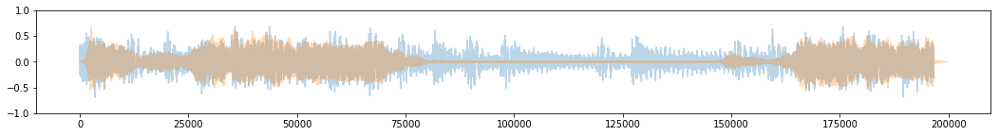

original vocals & recon vocals


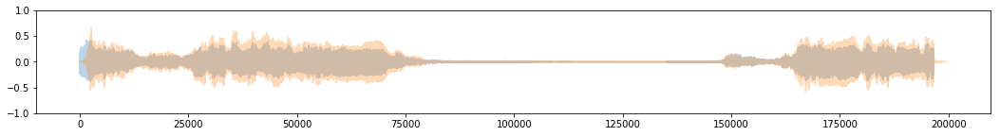

mix


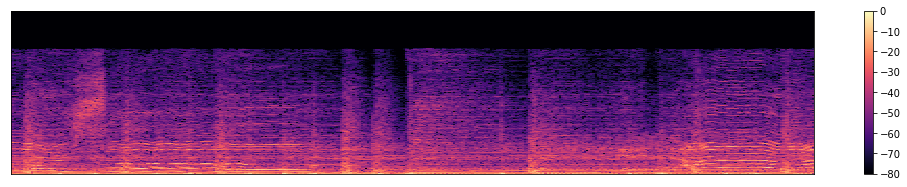

vocal


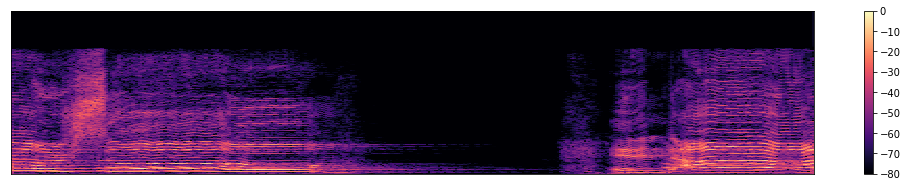

recon


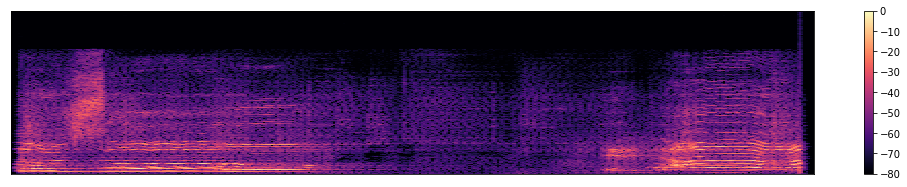

299047 0.057983577
299048 0.010444387
299049 0.021959381
299050 0.008632626
299051 0.007200955


KeyboardInterrupt: 

In [15]:
from IPython.display import clear_output
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt

# training parameters

loops = 500
batch = 1
length = int(2 ** 16) * 3

while(True):
    for _ in tqdm(range(loops)):
        _audios, _vocals = utils.get_data(batch, length, train_data_files)
        
        fetches = [train_step, loss, global_step, loss_hist]
        _, _loss, _global_step, _loss_hist = \
            sess.run(fetches, feed_dict={audios: _audios, vocals: _vocals})
        
        print(_global_step, _loss)
        
        if _global_step % 10 == 0:
            writer.add_summary(_loss_hist, _global_step)
        
        if _global_step % 1000 == 0:
            save_path = saver.save(sess, save_path, global_step=_global_step)
            print("Model saved in path: %s" % save_path)
        
    clear_output()
    
    _reconstructed_wave = sess.run(reconstructed_wave, feed_dict={audios: _audios})
    
    print('mix & recon vocals')
    plt.figure(figsize=[18, 2])
    plt.plot(_audios[0, :, 0], alpha=0.3)
    plt.plot(_reconstructed_wave[0, :, 0], alpha=0.3)
    plt.ylim([-1, 1])
    plt.show()

    print('original vocals & recon vocals')
    plt.figure(figsize=[18, 2])
    plt.plot(_vocals[0, :, 0], alpha=0.3)
    plt.plot(_reconstructed_wave[0, :, 0], alpha=0.3)
    plt.ylim([-1, 1])
    plt.show()
    
    print('mix')
    plt.figure(figsize=[18, 3])
    S = librosa.amplitude_to_db(np.abs(librosa.stft(_audios[0, :, 0])), ref=np.max)
    librosa.display.specshow(S)
    plt.colorbar()
    plt.show()
    
    print('vocal')
    plt.figure(figsize=[18, 3])
    S = librosa.amplitude_to_db(np.abs(librosa.stft(_vocals[0, :, 0])), ref=np.max)
    librosa.display.specshow(S)
    plt.colorbar()
    plt.show()
    
    _reconstructed_wave[np.isnan(_reconstructed_wave)] = 0
    print('recon')
    try:
        plt.figure(figsize=[18, 3])
        S = librosa.amplitude_to_db(np.abs(librosa.stft(_reconstructed_wave[0, :, 0])), ref=np.max)
        librosa.display.specshow(S)
        plt.colorbar()
        plt.show()
    except:
        pass
    

reconstructed left


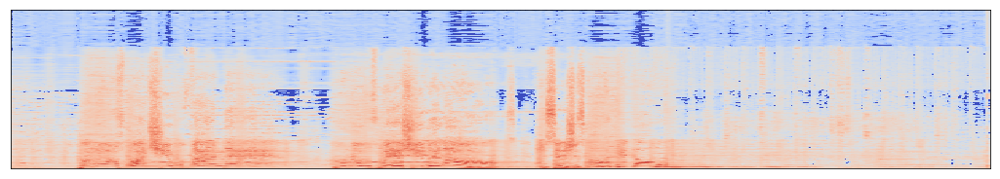

reconstructed right


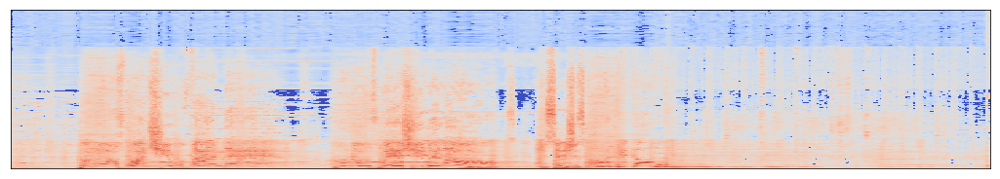

mixed & reconstructed left


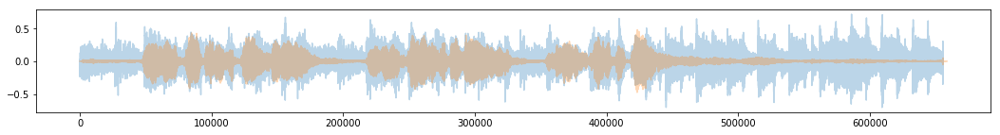

mixed & reconstructed right


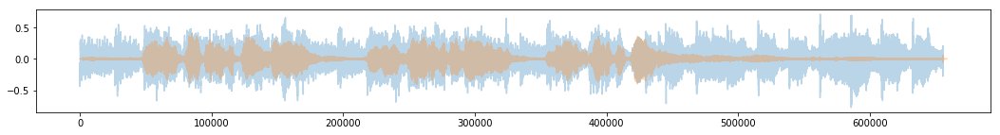

true vocal & reconstructed left


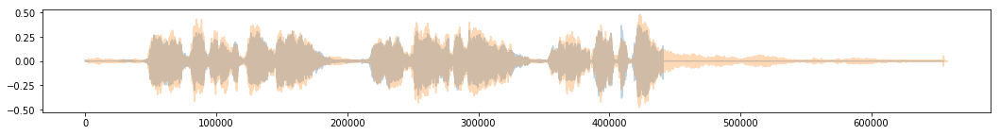

true vocal & reconstructed right


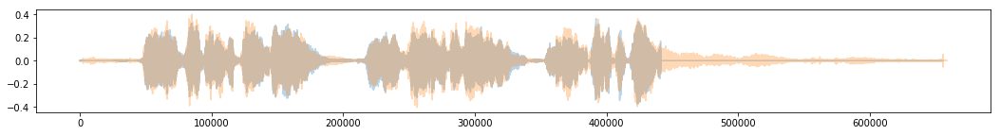

In [12]:
_audios, _vocals = utils.get_data(1, int(2 ** 16 * 10), test_data_files)

_recon_mag, _recon_phase, _reconstructed_wave = sess.run([outputs, audios_phase, reconstructed_wave], feed_dict={audios: _audios})

print('reconstructed left')
plt.figure(figsize=[18, 3])
librosa.display.specshow(utils.safe_log(np.exp(_recon_mag[0, :, :, 0].T) - 1))
plt.show()

print('reconstructed right')
plt.figure(figsize=[18, 3])
librosa.display.specshow(utils.safe_log(np.exp(_recon_mag[0, :, :, 1].T) - 1))
plt.show()

_reconstructed_wave[np.isnan(_reconstructed_wave)] = 0

print('mixed & reconstructed left')
plt.figure(figsize=[18, 2])
plt.plot(_audios[0, :, 0], alpha=0.3)
plt.plot(_reconstructed_wave[0, :, 0], alpha=0.3)
plt.show()

print('mixed & reconstructed right')
plt.figure(figsize=[18, 2])
plt.plot(_audios[0, :, 1], alpha=0.3)
plt.plot(_reconstructed_wave[0, :, 1], alpha=0.3)
plt.show()

print('true vocal & reconstructed left')
plt.figure(figsize=[18, 2])
plt.plot(_vocals[0, :, 0], alpha=0.3)
plt.plot(_reconstructed_wave[0, :, 0], alpha=0.3)
plt.show()

print('true vocal & reconstructed right')
plt.figure(figsize=[18, 2])
plt.plot(_vocals[0, :, 1], alpha=0.3)
plt.plot(_reconstructed_wave[0, :, 1], alpha=0.3)
plt.show()


import IPython.display as ipd
ipd.Audio(_reconstructed_wave[0, :].T, rate=44100)

In [13]:
import IPython.display as ipd
print('mixed audio')
ipd.Audio(_audios[0, :].T, rate=44100)

mixed audio


In [14]:
import IPython.display as ipd
print('true vocal')
ipd.Audio(_vocals[0, :].T, rate=44100)

true vocal
